**Hello Community,**

**This notebook is destined to show viewers differents techniques to approach Plant Seeedling classifcation problem. We will implement image processing techniques and see its effect on the predictive modeling part, below are the techniques used in this work. This notebook is exported from Google colab, a few adjustement will be needed to run it on kaggle (images paths)**

**Image processing :**

**Data augmentation**

**Image morphological operations (erosion and dilation)**

**Image segmentation**

**Modeling :**

**Convolutional neural network based model**

**InceptionV3 based model**

**Support vector machine based model**

We will need this module later on for the preprocessing part

In [ ]:
!pip install -U tensorflow-addons


     |████████████████████████████████| 1.1 MB 13.7 MB/s 


In [ ]:
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import tensorflow as tf
from keras import layers
import keras
import random
import numpy as np
%matplotlib inline
import tqdm
import cv2
import os 
import tensorflow_addons as tfa
from keras import layers
import gc
from tensorflow.keras.regularizers import l2


As we all know, the data is stored in google drive, I needed to unzip the 'train' and 'test' zip files in order to access image data contained in the folder.

In [ ]:
!unzip "drive/MyDrive/Data/Plant seedling classification/train.zip" -d "drive/MyDrive/Data/Plant seedling classification"
!unzip "drive/MyDrive/Data/Plant seedling classification/test.zip" -d "drive/MyDrive/Data/Plant seedling classification"

Here we get a grasp of the data distribution, we notice a clear imbalance in the dataset. Some plant species are more frequent then other, thus this could lead to an imminent bias in the predictive. There will be a good probability to label an image as "Loose Silky" or "Common Chickweed" regardless of how the plant features. We don't have enough examples of how other species look in order to be able to infere confidently. In fact we need a larger dataset to enable the model to understand the right spatial characteristics and patterns of each plant specie. Especially in the cases where the problem at hand is multilabeled, the larger the number of labels is, the bigger the dataset should be so as to distinct between different species with ease. We could solve this problem by augmenting and balancing the dataset.

black grass sample size :  263 

Charlock sample size :  390 

Cleavers sample size :  287 

Common Chickweed sample size :  611 

Common wheat sample size :  221 

Scentless Mayweed sample size :  516 

Fat Hen sample size :  475 

Loose Silky sample size :  654 

Maize sample size :  221 

Shepherds Purse sample size :  231 

Small flowered Cranesbill sample size :  496 

Sugar_beet sample size :  385 



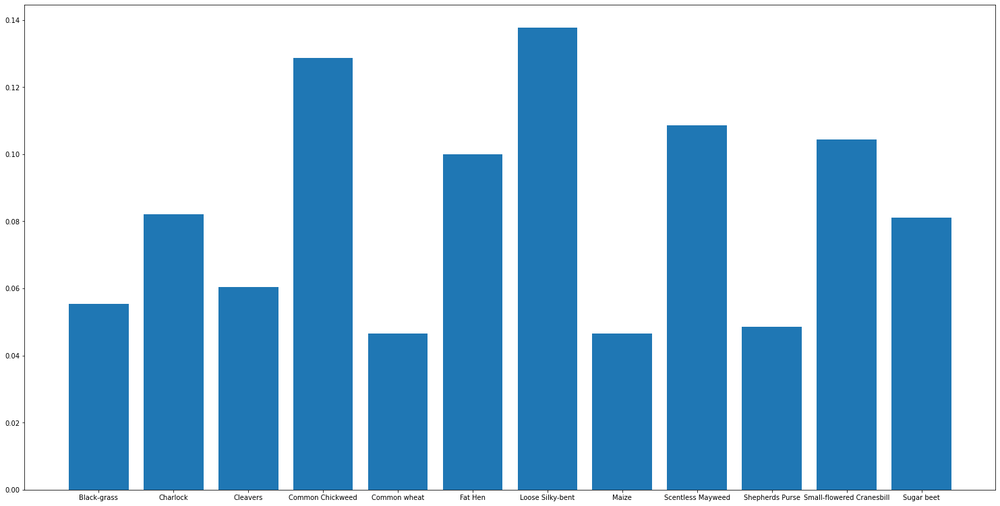

In [ ]:
training_images_files_names_black_grass = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Black-grass"))
training_images_files_names_Charlock = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Charlock"))
training_images_files_names_Cleavers = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Cleavers"))
training_images_files_names_Common_Chickweed = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Common Chickweed"))
training_images_files_names_Common_wheat = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Common wheat"))
training_images_files_names_Scentless_Mayweed = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Scentless Mayweed"))
training_images_files_names_Fat_Hen = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Fat Hen"))
training_images_files_names_Loose_Silky_bent = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Loose Silky-bent"))
training_images_files_names_Maize = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Maize"))
training_images_files_names_Shepherds_Purse = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Shepherds Purse"))
training_images_files_names_Small_flowered_Cranesbill = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Small-flowered Cranesbill"))
training_images_files_names_Sugar_beet = len(os.listdir("drive/MyDrive/Data/Plant seedling classification/train/Sugar beet"))
print("black grass sample size : ",training_images_files_names_black_grass,"\n")
print("Charlock sample size : ",training_images_files_names_Charlock,"\n")
print("Cleavers sample size : ",training_images_files_names_Cleavers,"\n")
print("Common Chickweed sample size : ",training_images_files_names_Common_Chickweed,"\n")
print("Common wheat sample size : ",training_images_files_names_Common_wheat,"\n")
print("Scentless Mayweed sample size : ",training_images_files_names_Scentless_Mayweed,"\n")
print("Fat Hen sample size : ",training_images_files_names_Fat_Hen,"\n")
print("Loose Silky sample size : ",training_images_files_names_Loose_Silky_bent,"\n")
print("Maize sample size : ",training_images_files_names_Maize,"\n")
print("Shepherds Purse sample size : ",training_images_files_names_Shepherds_Purse,"\n")
print("Small flowered Cranesbill sample size : ",training_images_files_names_Small_flowered_Cranesbill,"\n")
print("Sugar_beet sample size : ",training_images_files_names_Sugar_beet,"\n")
occurences = [training_images_files_names_black_grass/4750,training_images_files_names_Charlock/4750,training_images_files_names_Cleavers/4750,training_images_files_names_Common_Chickweed/4750,training_images_files_names_Common_wheat/4750,training_images_files_names_Fat_Hen/4750,training_images_files_names_Loose_Silky_bent/4750,training_images_files_names_Maize/4750,training_images_files_names_Scentless_Mayweed/4750,training_images_files_names_Shepherds_Purse/4750,training_images_files_names_Small_flowered_Cranesbill/4750,training_images_files_names_Sugar_beet/4750]
fig = plt.figure(figsize=[20,10])
ax = fig.add_axes([0,0,1,1])
#sns.displot(occurences, x="size", bins = ["Black-grass","Charlock","Cleavers","Common Chickweed","Common wheat","Fat Hen","Loose Silky-bent","Maize","Scentless Mayweed","Shepherds Purse","Small-flowered Cranesbill","Sugar beet"])
ax.bar(["Black-grass","Charlock","Cleavers","Common Chickweed","Common wheat","Fat Hen","Loose Silky-bent","Maize","Scentless Mayweed","Shepherds Purse","Small-flowered Cranesbill","Sugar beet"],occurences)
plt.show()



the script below allows you to visualize a sample of 3 images of each plant species

In [ ]:
plant_species = os.listdir("drive/MyDrive/Data/Plant seedling classification/train")
for plant_specie in plant_species:
   images_file_name = os.listdir("drive/MyDrive/Data/Plant seedling classification/train/"+plant_specie)
   sample_size_to_display = random.sample(range(0,100), 3)
   if plant_specie == ".ipynb_checkpoints":
     continue
   print("plant species :",plant_specie)
   for i in range(0,3): 
     img = cv2.imread("drive/MyDrive/Data/Plant seedling classification/train/"+plant_specie+"/"+images_file_name[sample_size_to_display[i]], cv2.IMREAD_COLOR)
     img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
     cv2_imshow(img)

We will be calling this function later on to visualize brut images and their corresponding processed versions

In [ ]:
def vizualize_random_images(original_tensor,transformed_tensor,sample_size_to_display):
     sample_size_to_display = random.sample(range(0,original_tensor.shape[0]), sample_size_to_display)
     for i in range(0,len(sample_size_to_display)): 
         img = original_tensor[sample_size_to_display[i]]
         mask = transformed_tensor[sample_size_to_display[i]]
         figure_size = 10
         print('Original image :')
         plt.figure(figsize=(figure_size,figure_size))
         plt.subplot(1,2,1)
         plt.imshow(img)
         plt.show()
         print('Transformed image :') 
         plt.figure(figsize=(figure_size,figure_size))
         plt.subplot(1,2,1)
         plt.imshow(mask)
         plt.show()

We proceed to read image data from their respective folders and store them in 4D array of size (number of image,100,100,3). We choose to resize image to the same dimension (100,100). Encode the species name following a one-hot encoding format, a matrix of size (number of images,12)

In [ ]:

 

# Labels encoding :
# black-grass : 0
# Charlock : 1
# Cleavers : 2
# Common_Chickweed : 3
# Common_wheat : 4
# Fat_Hen : 5
# Loose_Silky-bent : 6
# Maize : 7
# Scentless Mayweed : 8
# Shepherds Purse : 9
# Small flowered Cranesbill : 10
# Sugar beet : 11
label_encoding_mapper = {"Black-grass" : 0,"Charlock" : 1,"Cleavers": 2,"Common Chickweed" : 3,"Common wheat" : 4,"Fat Hen" : 5,"Loose Silky-bent" : 6,"Maize" : 7,"Scentless Mayweed" : 8,"Shepherds Purse" : 9,"Small-flowered Cranesbill" : 10,"Sugar beet" : 11}
training_size = training_images_files_names_black_grass + training_images_files_names_Charlock + training_images_files_names_Cleavers + training_images_files_names_Common_Chickweed + training_images_files_names_Common_wheat + training_images_files_names_Fat_Hen + training_images_files_names_Loose_Silky_bent + training_images_files_names_Maize + training_images_files_names_Scentless_Mayweed + training_images_files_names_Shepherds_Purse + training_images_files_names_Small_flowered_Cranesbill + training_images_files_names_Sugar_beet
y_train =  np.array([[0 for i in range(0,12)] for k in range(0,training_size)])
plant_species = os.listdir("drive/MyDrive/Data/Plant seedling classification/train")
plant_species.pop(11)
x_train = []
index = 0
for plant_specie in plant_species:
   images_file_name = os.listdir("drive/MyDrive/Data/Plant seedling classification/train/"+plant_specie)
   for i in range(0,len(images_file_name)):
     img = cv2.imread("drive/MyDrive/Data/Plant seedling classification/train/"+plant_specie+"/"+images_file_name[i], cv2.IMREAD_COLOR)
     img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
     if img.shape != (100,100,3):
         resized = cv2.resize(img,(100,100), interpolation = cv2.INTER_AREA)
     x_train = x_train + [resized]
     y_train[index][label_encoding_mapper[plant_specie]] = 1 
     index = index + 1
x_train = np.array(x_train)
y_train = np.array(y_train)


In [ ]:
x_test = []
test_images_path = os.listdir("drive/MyDrive/Data/Plant seedling classification/test")
test_size = len(test_images_path) 
for i in range(0,test_size):
    img = cv2.imread("drive/MyDrive/Data/Plant seedling classification/test/"+test_images_path[i], cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    if img.shape != (100,100,3):
        resized = cv2.resize(img,(100,100), interpolation = cv2.INTER_AREA)
    x_test = x_test + [resized]
x_test = np.array(x_test)

In [ ]:
print("training sample : ",x_train.shape,"  ",y_train.shape,"\n")
print("test sample : ",x_test.shape,"\n")


training sample :  (4750, 100, 100, 3)    (4750, 12) 

test sample :  (794, 100, 100, 3) 



Here we extract the images indices grouped by species from the array.

In [ ]:
plant_species= ["Black-grass","Charlock","Cleavers","Common Chickweed","Common wheat","Fat Hen","Loose Silky-bent","Maize","Scentless Mayweed","Shepherds Purse","Small-flowered Cranesbill","Sugar beet"]
index_storage = {"Black-grass" : [],"Charlock" : [],"Cleavers": [],"Common Chickweed" : [],"Common wheat" : [],"Fat Hen" : [],"Loose Silky-bent" : [],"Maize" : [],"Scentless Mayweed" : [],"Shepherds Purse" : [],"Small-flowered Cranesbill" : [],"Sugar beet" : []}
for i in range(0,len(x_train)):
    index = y_train[i].tolist().index(1)
    index_storage[plant_species[index]] = index_storage[plant_species[index]] + [i]

Then we apply random operations on images, so as to get a wider augmented dataset

In [ ]:
data_augmentation1 = tf.keras.Sequential([layers.RandomFlip("horizontal_and_vertical"),layers.RandomRotation(0.2)])
augmented_dataset1 = data_augmentation1(x_train)
gc.collect()
data_augmentation2 = tf.keras.Sequential([layers.RandomTranslation(height_factor=(-0.1,0.1),width_factor=(-0.1,0.1),interpolation="nearest")])
augmented_dataset2 = data_augmentation2(x_train)
gc.collect()
data_augmentation3 = tf.keras.Sequential([layers.RandomFlip("horizontal_and_vertical"),layers.RandomRotation(0.3)])
augmented_dataset3 = data_augmentation3(x_train)
gc.collect()

1744

Here we apply a processing procedure to each plant specie. We augment the specie sample up to a certain size specified by the parameter "Specie_total_size", the parameter "training_size" refers to the specie sample size. The augmented batches are concatenated to the 4D Tensor that embedds the original dataset.

In [ ]:

def augment_data(x_train,y_train,Specie,training_size,Specie_total_size):

  j = training_size
  one_hot_encoded_array_for_species = [0 for i in range(0,12)]
  for i in range(0,12):
      if label_encoding_mapper[Specie] == i:
           one_hot_encoded_array_for_species[i] = 1

  while j <= Specie_total_size:
     if j + training_size > Specie_total_size:
        b = training_size - (j + training_size - Specie_total_size)
        dummy_variable = random.randint(1,3)
        if dummy_variable == 1:
           augmented_dataset = data_augmentation1(x_train[index_storage[Specie]])
           gc.collect()
        if dummy_variable == 2:
           augmented_dataset = data_augmentation2(x_train[index_storage[Specie]])
           gc.collect()
        if dummy_variable == 3:
           augmented_dataset = data_augmentation3(x_train[index_storage[Specie]])
           gc.collect()
        x_train = np.concatenate([x_train,augmented_dataset[:b]])
        for i in range(0,b):
          y_train = y_train + [one_hot_encoded_array_for_species] 
     else:
        dummy_variable = random.randint(1,3)
        if dummy_variable == 1:
           augmented_dataset = data_augmentation1(x_train[index_storage[Specie]])
           gc.collect()
        if dummy_variable == 2:
           augmented_dataset = data_augmentation2(x_train[index_storage[Specie]])
           gc.collect()
        if dummy_variable == 3:
           augmented_dataset = data_augmentation3(x_train[index_storage[Specie]])
           gc.collect()
        x_train = np.concatenate([x_train,augmented_dataset])
        for i in range(0,training_size):
          y_train = y_train + [one_hot_encoded_array_for_species]
     j = j + training_size
     gc.collect()
     
  print(x_train.shape)
  


If we apply this procedure for every plant specie with the same parameter "Specie_total_size", we get a fully balanced dataset with augmented images. However "Specie_total_size" parameter shouldn't be too large due to the limited RAM resources available. the higher "Specie_total_size" is, the more computations should be made on the specie image batch, thus the more augmented images should be loaded into RAM. Each augmented batch consumes considerable memory space, therefore an overflow could be easily attained.

In [ ]:
augment_data(x_train,y_train,"Black-grass",len(index_storage["Black-grass"]),1000)

(5487, 100, 100, 3)


after augmenting black grass specie sample up to 1000 image we get a training set of size equal 5478 = 4750 (initial sample) + 728 (additional black grass augmented images)

# 1) Image processing
   # 1.1) Image blurring 

We start by applying gaussian filter to smoothen the image. As we can see the plant images contains many useless edges in the background, that are formed by the rocks. These edges would just create background noise, therefore we transform the discontinous pixels values into continous ones.  

Original image :


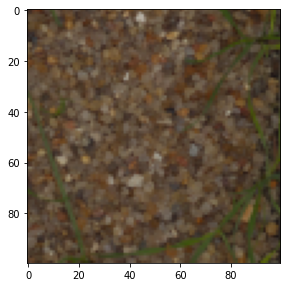

Transformed image :


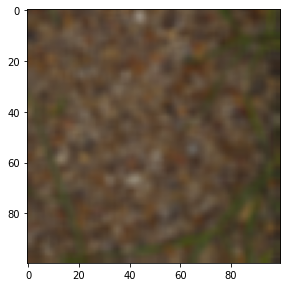

Original image :


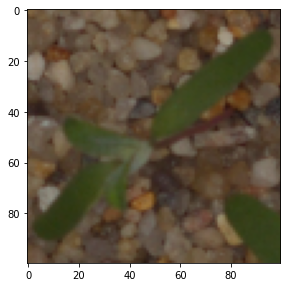

Transformed image :


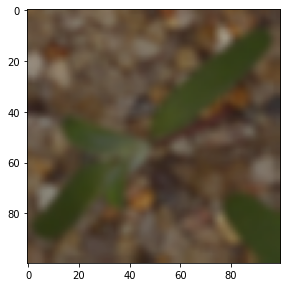

In [ ]:
x_train_blurred = tfa.image.gaussian_filter2d(x_train,filter_shape=(4,4),sigma=100)
x_test_blurred = tfa.image.gaussian_filter2d(x_test,filter_shape=(4,4),sigma=100)
vizualize_random_images(x_train,x_train_blurred,2)


Our next step will consist of detecting the usefull information in the image, and eliminating the background. We need to construct a binary image (black and white) that indicate the object, that we wish to classify. We will be able to observe the shape of the usefull object alone, and the classification process will be much easier.
In order to achieve this, we convert RGB image to HSV format, a much helpful format to distinguish between colors. Luckily, the object detection problem at hand is simple one, because the object is clearly distinguishable from the background, no overlap so far (meaning no green background that could overlap with plants green color). Unfortunately, we would still have some noise ,imperfections in the image, thus as follow up, we erode the image a little bit ( to eliminate the isolated portions of the image that doesn't correspond to parts of the plant, noise in other words ) and then right after apply dilation to put more emphasis on the object shape.

In [ ]:
def segment_image(img): 
  img2 = cv2.cvtColor(np.float32(img),cv2.COLOR_RGB2HSV)
  green_segment_values = 50
  hsv_lower_bound = np.array([100-green_segment_values,0,0])
  hsv_upper_bound = np.array([100+green_segment_values,255,240])
  mask = cv2.inRange(img2,hsv_lower_bound,hsv_upper_bound)
  kernel = np.ones((3,3),np.uint8)
  mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
  return mask

  

We define a function that applies the processing pipeling to each image in the dataset and returns the processed dataset.

In [ ]:
def preprocess_dataset(x_train):
  preprocessed_data = []
  for i in range(0,x_train.shape[0]):
    preprocessed_data = preprocessed_data + [segment_image(x_train[i])]
  return preprocessed_data 

Original image :


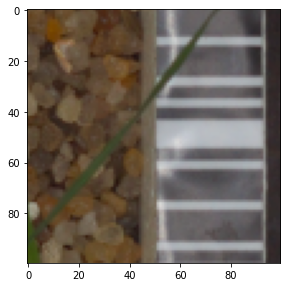

Transformed image :


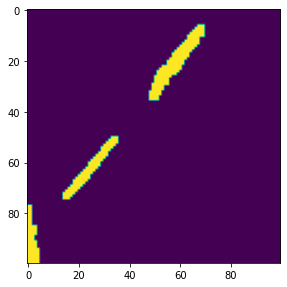

Original image :


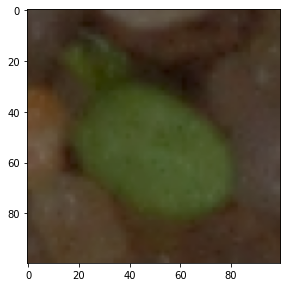

Transformed image :


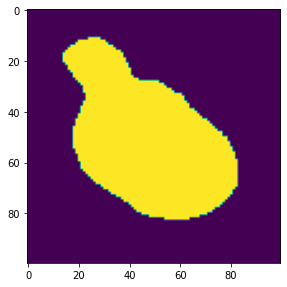

In [ ]:
preprocessed_data = np.array(preprocess_dataset(x_train_blurred))
preprocessed_test_data = np.array(preprocess_dataset(x_test_blurred))
vizualize_random_images(x_train,preprocessed_data,2)

We split the original dataset into training and validation

In [ ]:
(x_training, valX, y_training, valY) = train_test_split(x_train,y_train,test_size=0.15, random_state=10)


Then we embedd the training and validation set into an ImageDataGenerator object to generate batches of augmented images.

In [ ]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=20,horizontal_flip=True,vertical_flip=True,rescale=1/255)
datagen.fit(x_training)
it = datagen.flow(x_training,y_training,batch_size=32)
datagenval = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)
datagenval.fit(valX)
itval = datagenval.flow(valX, valY)
datagentest = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)
datagentest.fit(x_test)
ittest = datagentest.flow(x_test)





We split the newly processed dataset and embedds into an ImageDataGenerator.

In [ ]:
(x_training_processed, valX_processed, y_training_processed, valY_processed) = train_test_split(preprocessed_data,y_train,test_size=0.15, random_state=10)



In [ ]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=20,horizontal_flip=True,vertical_flip=True,rescale=1/255)
x_training_processed = tf.reshape(x_training_processed,shape=(4037, 100, 100,1))
datagen.fit(x_training_processed)
training_processed_data_flow = datagen.flow(x_training_processed,y_training_processed)
datagenval = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)
valX_processed = tf.reshape(valX_processed,shape=(713, 100, 100,1))
datagenval.fit(valX_processed)
validation_processed_data_flow = datagenval.flow(valX_processed,valY_processed)
datagentest = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)
preprocessed_test_data = tf.reshape(preprocessed_test_data,shape=(794, 100, 100,1))
datagentest.fit(preprocessed_test_data)
test_processed_data_flow = datagentest.flow(preprocessed_test_data)

We do this in order to have both instances of data available and be able to compare. Next we set the parameters, that will be used during training.

In [ ]:
INIT_LR = 1e-2 # initial learning rate
BATCH_SIZE = 32
EPOCHS = 5

s = tf.keras.backend.clear_session()  # clear default graph
# don't call K.set_learning_phase() !!! (otherwise will enable dropout in train/test simultaneously)
#model = make_model()  # define our model
opt = tf.keras.optimizers.Adam(learning_rate=INIT_LR)
# prepare model for fitting (loss, optimizer, etc)
tqdm_callback = tfa.callbacks.TQDMProgressBar()


# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
     #return (INIT_LR*0.9)**epoch
   return (INIT_LR * 1.1)  
    #return INIT_LR
# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", tf.keras.backend.get_value(model.optimizer.lr))
class GarbageCollectorCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        gc.collect()


Next we train multiple models on both versions of dataset.

In [ ]:
def make_svm_model():
    
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Flatten())    
    model.add(tf.keras.layers.Dense(12,kernel_regularizer=l2(100),activation= 'linear'))
  
    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 10000)             0         
                                                                 
 dense (Dense)               (None, 12)                120012    
                                                                 
Total params: 120,012
Trainable params: 120,012
Non-trainable params: 0
_________________________________________________________________


Training:   0%|           0/15 ETA: ?s,  ?epochs/s

Learning rate: 0.011
Epoch 1/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 2/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 3/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 4/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 5/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 6/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 7/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 8/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 9/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 10/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 11/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 12/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 13/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 14/15


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 15/15


0/127           ETA: ?s - 

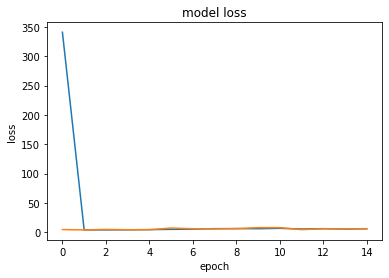

In [ ]:
s = tf.keras.backend.clear_session()
model = make_svm_model()
model.build(input_shape=(None,100,100,1))
model.summary()

model.compile(
    loss='categorical_hinge',
    optimizer=opt,  # for SGD
    metrics=[tfa.metrics.F1Score(num_classes=12,average="micro")]  # report accuracy during training
)
history = model.fit(
    training_processed_data_flow,  # prepared data
    epochs=15,
    validation_data=validation_processed_data_flow,
    #steps_per_epoch=len(x_training) // BATCH_SIZE,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               tqdm_callback,
               GarbageCollectorCallback(),
               ],
    shuffle=True
    ,verbose=0)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show() 

In [ ]:
def make_customized_cnn_model(image_number_channel):
    

    model = tf.keras.Sequential()
    
    model.add(tf.keras.layers.Conv2D(64, (3, 3), strides = (1, 1), padding="same", name = 'conv1', input_shape=(100,100,image_number_channel)))   
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    

    model.add(tf.keras.layers.Conv2D(64, (3, 3), strides = (1, 1), padding="same", name = 'conv2'))   
    model.add(tf.keras.layers.MaxPooling2D((2, 2),padding="same",name='max_pool_1'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    
    
   
    

    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))


    model.add(tf.keras.layers.Conv2D(128, (3, 3), strides = (1, 1), padding="same", name = 'conv3'))   
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
   
    model.add(tf.keras.layers.Conv2D(128, (3, 3), strides = (1, 1), padding="same", name = 'conv4'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2),padding="same",name='max_pool_2'))   
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    
   
    
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))
    
    
    model.add(tf.keras.layers.Conv2D(256, (3, 3), strides = (1, 1), padding="same", name = 'conv5', input_shape=(100,100,1)))   
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
   
    model.add(tf.keras.layers.Conv2D(256, (3, 3), strides = (1, 1), padding="same", name = 'conv6', input_shape=(100,100,1))) 
    model.add(tf.keras.layers.MaxPooling2D((2, 2),padding="same",name='max_pool_3'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    
    

    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))

    model.add(tf.keras.layers.Flatten())    
    
    
    model.add(tf.keras.layers.Dense(256, name='fc1'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))
    model.add(tf.keras.layers.Dense(256, name='fc2'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))

    model.add(tf.keras.layers.Dense(12))    
    model.add(tf.keras.layers.Activation("softmax"))  
    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1 (Conv2D)              (None, 100, 100, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv2 (Conv2D)              (None, 100, 100, 64)      36928     
                                                                 
 max_pool_1 (MaxPooling2D)   (None, 50, 50, 64)        0         
                                                                 
 batch_normalization_1 (Batc  (None, 50, 50, 64)       256       
 hNormalization)                                        

Training:   0%|           0/200 ETA: ?s,  ?epochs/s

Learning rate: 0.011
Epoch 1/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 2/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 3/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 4/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 5/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 6/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 7/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 8/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 9/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 10/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 11/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 12/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 13/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 14/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 15/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 16/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 17/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 18/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 19/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 20/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 21/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 22/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 23/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 24/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 25/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 26/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 27/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 28/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 29/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 30/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 31/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 32/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 33/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 34/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 35/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 36/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 37/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 38/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 39/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 40/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 41/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 42/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 43/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 44/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 45/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 46/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 47/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 48/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 49/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 50/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 51/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 52/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 53/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 54/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 55/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 56/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 57/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 58/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 59/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 60/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 61/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 62/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 63/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 64/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 65/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 66/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 67/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 68/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 69/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 70/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 71/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 72/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 73/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 74/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 75/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 76/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 77/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 78/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 79/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 80/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 81/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 82/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 83/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 84/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 85/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 86/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 87/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 88/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 89/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 90/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 91/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 92/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 93/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 94/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 95/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 96/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 97/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 98/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 99/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 100/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 101/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 102/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 103/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 104/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 105/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 106/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 107/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 108/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 109/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 110/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 111/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 112/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 113/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 114/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 115/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 116/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 117/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 118/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 119/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 120/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 121/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 122/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 123/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 124/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 125/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 126/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 127/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 128/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 129/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 130/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 131/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 132/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 133/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 134/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 135/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 136/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 137/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 138/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 139/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 140/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 141/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 142/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 143/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 144/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 145/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 146/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 147/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 148/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 149/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 150/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 151/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 152/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 153/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 154/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 155/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 156/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 157/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 158/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 159/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 160/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 161/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 162/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 163/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 164/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 165/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 166/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 167/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 168/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 169/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 170/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 171/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 172/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 173/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 174/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 175/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 176/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 177/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 178/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 179/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 180/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 181/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 182/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 183/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 184/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 185/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 186/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 187/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 188/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 189/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 190/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 191/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 192/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 193/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 194/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 195/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 196/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 197/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 198/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 199/200


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 200/200


0/126           ETA: ?s - 

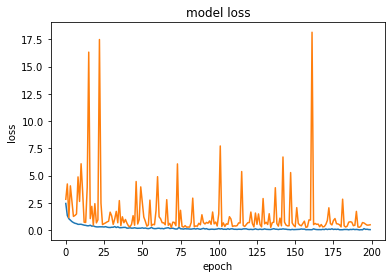

In [ ]:
s = tf.keras.backend.clear_session()
model = make_customized_cnn_model(3)
model.summary()
tqdm_callback = tfa.callbacks.TQDMProgressBar()

model.compile(
    loss='categorical_crossentropy',  
    optimizer=opt,  
    metrics=[tfa.metrics.F1Score(num_classes=12,average="micro")] 
)
history = model.fit(
    it,  
    epochs=200,
    validation_data=itval,
    steps_per_epoch=len(x_training) // BATCH_SIZE,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               tqdm_callback,
               GarbageCollectorCallback(),
               ],
    shuffle=True
    ,verbose=0)

plt.plot(history.history['loss'],label="training loss")
plt.plot(history.history['val_loss'],label="validation loss")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show() 

In [ ]:
model.save("/content/drive/MyDrive/Data/Plant seedling classification/saved_models/custom cnn model for raw data")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1 (Conv2D)              (None, 100, 100, 64)      640       
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv2 (Conv2D)              (None, 100, 100, 64)      36928     
                                                                 
 max_pool_1 (MaxPooling2D)   (None, 50, 50, 64)        0         
                                                                 
 batch_normalization_1 (Batc  (None, 50, 50, 64)       256       
 hNormalization)                                        

Training:   0%|           0/250 ETA: ?s,  ?epochs/s

Learning rate: 0.011
Epoch 1/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 2/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 3/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 4/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 5/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 6/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 7/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 8/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 9/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 10/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 11/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 12/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 13/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 14/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 15/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 16/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 17/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 18/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 19/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 20/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 21/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 22/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 23/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 24/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 25/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 26/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 27/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 28/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 29/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 30/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 31/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 32/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 33/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 34/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 35/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 36/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 37/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 38/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 39/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 40/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 41/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 42/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 43/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 44/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 45/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 46/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 47/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 48/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 49/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 50/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 51/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 52/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 53/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 54/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 55/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 56/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 57/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 58/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 59/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 60/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 61/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 62/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 63/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 64/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 65/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 66/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 67/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 68/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 69/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 70/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 71/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 72/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 73/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 74/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 75/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 76/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 77/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 78/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 79/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 80/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 81/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 82/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 83/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 84/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 85/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 86/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 87/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 88/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 89/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 90/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 91/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 92/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 93/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 94/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 95/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 96/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 97/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 98/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 99/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 100/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 101/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 102/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 103/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 104/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 105/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 106/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 107/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 108/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 109/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 110/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 111/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 112/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 113/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 114/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 115/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 116/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 117/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 118/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 119/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 120/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 121/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 122/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 123/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 124/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 125/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 126/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 127/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 128/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 129/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 130/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 131/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 132/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 133/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 134/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 135/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 136/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 137/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 138/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 139/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 140/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 141/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 142/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 143/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 144/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 145/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 146/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 147/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 148/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 149/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 150/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 151/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 152/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 153/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 154/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 155/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 156/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 157/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 158/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 159/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 160/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 161/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 162/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 163/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 164/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 165/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 166/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 167/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 168/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 169/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 170/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 171/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 172/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 173/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 174/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 175/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 176/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 177/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 178/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 179/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 180/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 181/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 182/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 183/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 184/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 185/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 186/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 187/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 188/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 189/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 190/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 191/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 192/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 193/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 194/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 195/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 196/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 197/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 198/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 199/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 200/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 201/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 202/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 203/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 204/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 205/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 206/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 207/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 208/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 209/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 210/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 211/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 212/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 213/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 214/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 215/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 216/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 217/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 218/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 219/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 220/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 221/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 222/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 223/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 224/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 225/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 226/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 227/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 228/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 229/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 230/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 231/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 232/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 233/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 234/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 235/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 236/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 237/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 238/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 239/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 240/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 241/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 242/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 243/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 244/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 245/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 246/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 247/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 248/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 249/250


0/127           ETA: ?s - 

Learning rate: 0.011
Epoch 250/250


0/127           ETA: ?s - 

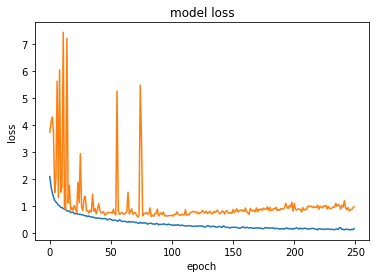

In [ ]:
s = tf.keras.backend.clear_session()
model = make_customized_cnn_model(1)
model.summary()

model.compile(
    loss='categorical_crossentropy',  
    optimizer=opt,  
    metrics=[tfa.metrics.F1Score(num_classes=12,average="micro")]  
)
history = model.fit(
    training_processed_data_flow, 
    epochs=250,
    validation_data=validation_processed_data_flow,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               tqdm_callback,
               GarbageCollectorCallback(),
               ],
    shuffle=True
    ,verbose=0)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show() 

Inception model doesn't accept binary images as input. It always work with 3 channels

In [ ]:
model.save("/content/drive/MyDrive/Data/Plant seedling classification/saved_models/custom cnn model for processed data")

In [ ]:
def make_Inception_based_model():

    model = tf.keras.Sequential()
    
    model.add(tf.keras.applications.InceptionV3(weights='imagenet',include_top=False,input_shape=(100,100,3)))
    model.add(tf.keras.layers.Flatten())    

    
    model.add(tf.keras.layers.Dense(256, name='fc1'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))
    model.add(tf.keras.layers.Dense(256, name='fc2'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))
    # FC
    model.add(tf.keras.layers.Dense(12))  # the last layer with neuron for each class    
    model.add(tf.keras.layers.Activation("softmax"))  # output probabilities
    return model
    
    
    
   
    
    
    

In [ ]:
def make_svm_based_model_with_cnn_features_extractor():

    model = tf.keras.Sequential()

    model.add(tf.keras.layers.Conv2D(64, (3, 3), strides = (1, 1), padding="same", name = 'conv1', input_shape=(100,100,1)))   
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    
 
    model.add(tf.keras.layers.Conv2D(64, (3, 3), strides = (1, 1), padding="same", name = 'conv2'))   
    model.add(tf.keras.layers.MaxPooling2D((2, 2),padding="same",name='max_pool_1'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    
    
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))


    
    model.add(tf.keras.layers.Conv2D(128, (3, 3), strides = (1, 1), padding="same", name = 'conv3'))   
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    
 
    model.add(tf.keras.layers.Conv2D(128, (3, 3), strides = (1, 1), padding="same", name = 'conv4'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2),padding="same",name='max_pool_2'))   
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    
    

    
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))
    
    
    model.add(tf.keras.layers.Conv2D(256, (3, 3), strides = (1, 1), padding="same", name = 'conv5', input_shape=(100,100,1)))   
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))

    model.add(tf.keras.layers.Conv2D(256, (3, 3), strides = (1, 1), padding="same", name = 'conv6', input_shape=(100,100,1))) 
    model.add(tf.keras.layers.MaxPooling2D((2, 2),padding="same",name='max_pool_3'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation("relu"))
    
   
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))
    
  

    model.add(tf.keras.layers.Flatten())  
    model.add(tf.keras.layers.Dense(256, name='fc1'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0))  
    model.add(tf.keras.layers.Dense(256, name='fc2'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(0.10, noise_shape=None, seed=0)) 
    model.add(tf.keras.layers.Dense(12,kernel_regularizer=l2(100),activation= 'tanh'))

  

    
    return model
    
    
    
   
    
    
    

87924736/87910968 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 1, 1, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 fc1 (Dense)                 (None, 256)               524544    
                                                                 
 batch_normalization_94 (Bat  (None, 256)              1024      
 chNormalization)                                                
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 fc2 (Dense)                 (None, 256)               65

Training:   0%|           0/250 ETA: ?s,  ?epochs/s

Learning rate: 0.011
Epoch 1/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 2/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 3/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 4/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 5/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 6/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 7/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 8/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 9/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 10/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 11/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 12/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 13/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 14/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 15/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 16/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 17/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 18/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 19/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 20/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 21/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 22/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 23/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 24/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 25/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 26/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 27/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 28/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 29/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 30/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 31/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 32/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 33/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 34/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 35/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 36/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 37/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 38/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 39/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 40/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 41/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 42/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 43/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 44/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 45/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 46/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 47/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 48/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 49/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 50/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 51/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 52/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 53/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 54/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 55/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 56/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 57/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 58/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 59/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 60/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 61/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 62/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 63/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 64/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 65/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 66/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 67/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 68/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 69/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 70/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 71/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 72/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 73/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 74/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 75/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 76/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 77/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 78/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 79/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 80/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 81/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 82/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 83/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 84/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 85/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 86/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 87/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 88/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 89/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 90/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 91/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 92/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 93/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 94/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 95/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 96/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 97/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 98/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 99/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 100/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 101/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 102/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 103/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 104/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 105/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 106/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 107/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 108/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 109/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 110/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 111/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 112/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 113/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 114/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 115/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 116/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 117/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 118/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 119/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 120/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 121/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 122/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 123/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 124/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 125/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 126/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 127/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 128/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 129/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 130/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 131/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 132/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 133/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 134/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 135/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 136/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 137/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 138/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 139/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 140/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 141/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 142/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 143/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 144/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 145/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 146/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 147/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 148/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 149/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 150/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 151/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 152/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 153/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 154/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 155/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 156/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 157/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 158/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 159/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 160/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 161/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 162/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 163/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 164/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 165/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 166/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 167/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 168/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 169/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 170/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 171/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 172/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 173/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 174/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 175/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 176/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 177/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 178/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 179/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 180/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 181/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 182/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 183/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 184/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 185/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 186/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 187/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 188/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 189/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 190/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 191/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 192/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 193/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 194/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 195/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 196/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 197/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 198/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 199/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 200/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 201/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 202/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 203/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 204/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 205/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 206/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 207/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 208/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 209/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 210/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 211/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 212/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 213/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 214/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 215/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 216/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 217/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 218/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 219/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 220/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 221/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 222/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 223/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 224/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 225/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 226/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 227/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 228/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 229/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 230/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 231/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 232/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 233/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 234/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 235/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 236/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 237/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 238/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 239/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 240/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 241/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 242/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 243/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 244/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 245/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 246/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 247/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 248/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 249/250


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 250/250


0/126           ETA: ?s - 

Text(0, 0.5, 'loss')

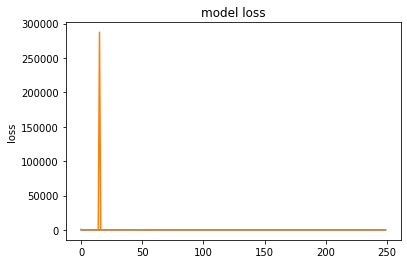

In [ ]:
s = tf.keras.backend.clear_session()
model = make_Inception_based_model()
model.summary()
tqdm_callback = tfa.callbacks.TQDMProgressBar()

model.compile(
    loss='categorical_crossentropy',  
    optimizer=opt,  
    metrics=[tfa.metrics.F1Score(num_classes=12,average="micro")]  
)
history = model.fit(
    it,  # prepared data
    epochs=250,
    validation_data=itval,
    steps_per_epoch=len(x_training) // BATCH_SIZE,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               tqdm_callback,
               GarbageCollectorCallback(),
               ],
    shuffle=True
    ,verbose=0)

plt.plot(history.history['loss'],label="training loss")
plt.plot(history.history['val_loss'],label="validation loss")
plt.title('model loss')
plt.ylabel('loss')

In [ ]:
model.save("/content/drive/MyDrive/Data/Plant seedling classification/saved_models/inception model")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1 (Conv2D)              (None, 100, 100, 64)      640       
                                                                 
 batch_normalization (BatchN  (None, 100, 100, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 100, 100, 64)      0         
                                                                 
 conv2 (Conv2D)              (None, 100, 100, 64)      36928     
                                                                 
 max_pool_1 (MaxPooling2D)   (None, 50, 50, 64)        0         
                                                                 
 batch_normalization_1 (Batc  (None, 50, 50, 64)       256       
 hNormalization)                                        

Training:   0%|           0/15 ETA: ?s,  ?epochs/s

Learning rate: 0.011
Epoch 1/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 2/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 3/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 4/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 5/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 6/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 7/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 8/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 9/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 10/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 11/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 12/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 13/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 14/15


0/126           ETA: ?s - 

Learning rate: 0.011
Epoch 15/15


0/126           ETA: ?s - 

Text(0, 0.5, 'loss')

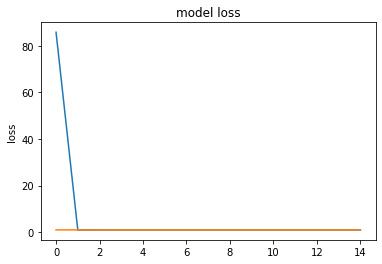

In [ ]:
s = tf.keras.backend.clear_session()
model = make_svm_based_model_with_cnn_features_extractor()
model.summary()
tqdm_callback = tfa.callbacks.TQDMProgressBar()

model.compile(
    loss='categorical_hinge', 
    optimizer=opt,  
    metrics=[tfa.metrics.F1Score(num_classes=12,average="micro")]  
)
history = model.fit(
    training_processed_data_flow,  
    epochs=15,
    validation_data=validation_processed_data_flow,
    steps_per_epoch=len(x_training) // BATCH_SIZE,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               tqdm_callback,
               GarbageCollectorCallback(),
               ],
    shuffle=True
    ,verbose=0)

plt.plot(history.history['loss'],label="training loss")
plt.plot(history.history['val_loss'],label="validation loss")
plt.title('model loss')
plt.ylabel('loss')

save the model into google drive via the specified path location, so you can load it back later and use it for future predictions.

We can then infere on unseen images

In [ ]:
y_pred_test = model.predict(ittest)
y_pred_test_classes = np.argmax(y_pred_test, axis=1)

In brief, the models inceptions and cnn were the much more promosing.

That's it, thanks for giving time to this notebook, I hope it got you ready and inspired to create more advanced model!, feel free to ask anything in the comment section, or provide me with some more guidance or tips on how I could better present my work.

the following code creates. the submission file

In [ ]:
plant_species = ["Black-grass","Charlock","Cleavers","Common Chickweed","Common wheat","Fat Hen","Loose Silky-bent","Maize","Scentless Mayweed","Shepherds Purse","Small-flowered Cranesbill","Sugar beet"]
label_encoding_mapper = {"Black-grass" : 0,"Charlock" : 1,"Cleavers": 2,"Common Chickweed" : 3,"Common wheat" : 4,"Fat Hen" : 5,"Loose Silky-bent" : 6,"Maize" : 7,"Scentless Mayweed" : 8,"Shepherds Purse" : 9,"Small-flowered Cranesbill" : 10,"Sugar beet" : 11}
url = "/content/drive/MyDrive/Data/Plant seedling classification/sample_submission(14)(2).csv"
submission = pd.read_csv(url)
for i in range(0,submission.shape[0]):
   submission.loc[i,"species"] = plant_species[y_pred_test_classes[i]]

submission.to_csv("/content/drive/MyDrive/Data/Plant seedling classification/sample_submission.csv")